Hi, we are Team Epimonos! Welcome!\
In this Jupyter Notebook, we will be showcasing spectral subtraction. 

You might need to rerun this notebook with Jupyter Notebook in order to listen to the audio documents.\
If so, please make sure that the 2 audio documents in the same folder as this notebook on GitHub are available, and make sure you have located them in the same folder as this notebook when you have downloaded it. 

Thank you!

---

In [3]:
pip install noisereduce

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pydub

Note: you may need to restart the kernel to use updated packages.


In [5]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
import librosa
%matplotlib inline

C:\Users\User\anaconda3\lib\site-packages\noisereduce\noisereduce.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# Example 1

Import audio and convert stereo track to mono track

In [32]:
from pydub import AudioSegment
sound = AudioSegment.from_wav("input_fan2.wav")
sound = sound.set_channels(1)
sound.export("input_fan2(mono).wav", format="wav")

<_io.BufferedRandom name='input_fan2(mono).wav'>

In [7]:
data, rate = sf.read("input_fan2(mono).wav")
data = data

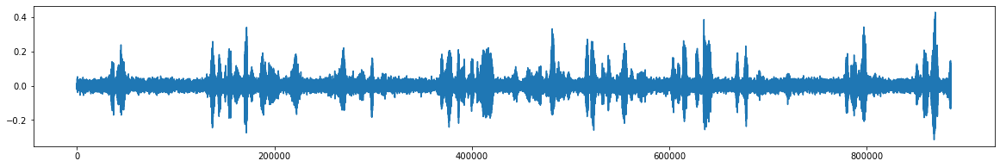

In [8]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

Original noisy audio:

In [9]:
IPython.display.Audio(data=data, rate=rate)

In [10]:
#select noisy part
noisy_part = data[10000:15000]

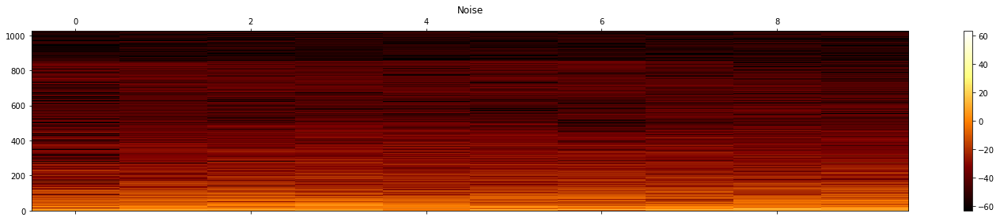

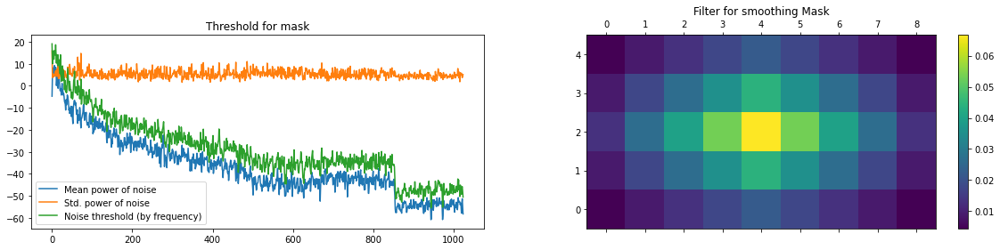

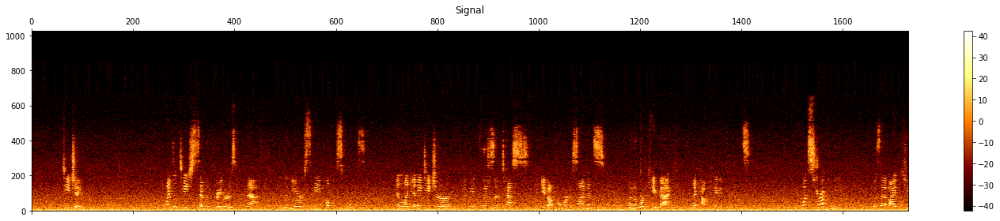

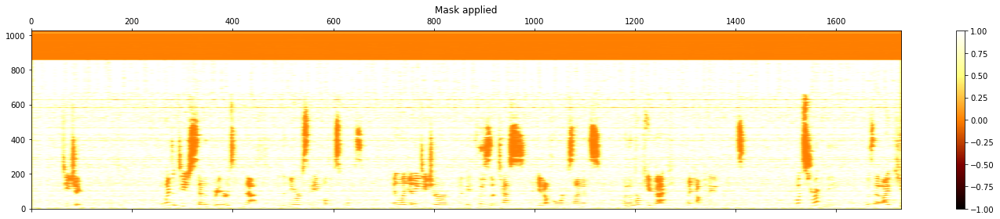

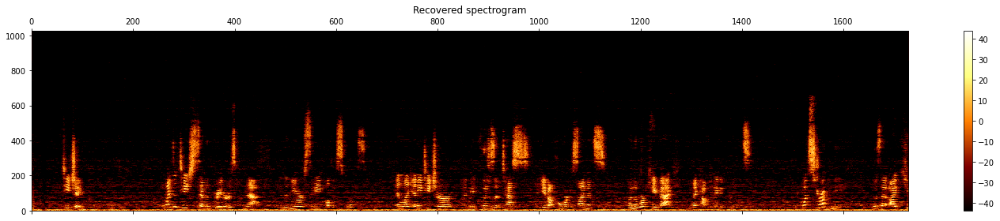

In [11]:
# perform noise reduction
reduced_noise = nr.reduce_noise(audio_clip=data, noise_clip=noisy_part, verbose=True)

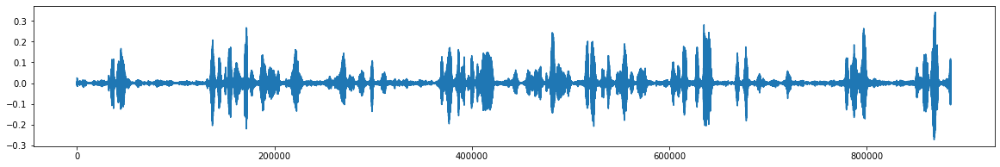

In [12]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

Processed audio:

In [13]:
IPython.display.Audio(data=reduced_noise, rate=rate)

Here, we got a much clearer audio.\
It has shown that spectral subtraction works well on removing constant background noise.

# Example 2

Import audio and convert stereo track to mono track

In [34]:
from pydub import AudioSegment
sound = AudioSegment.from_wav("input_noisy cafe.wav")
sound = sound.set_channels(1)
sound.export("input_noisy cafe(mono).wav", format="wav")

<_io.BufferedRandom name='input_noisy cafe(mono).wav'>

In [35]:
data, rate = sf.read("input_noisy cafe(mono).wav")
data = data

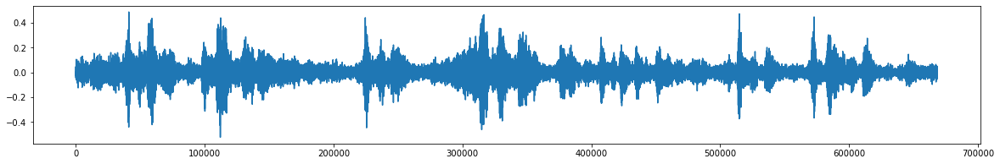

In [36]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

Original noisy audio:

In [37]:
IPython.display.Audio(data=data, rate=rate)

In [38]:
#select noisy part
noisy_part = data[10000:15000]

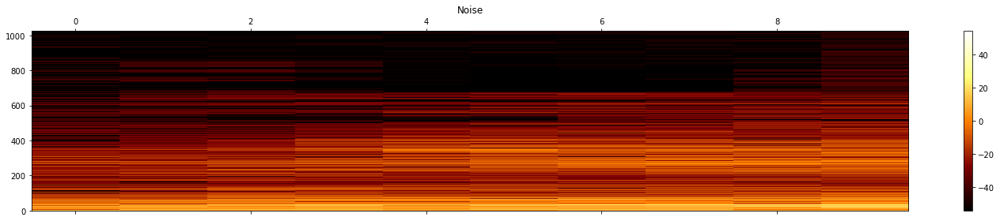

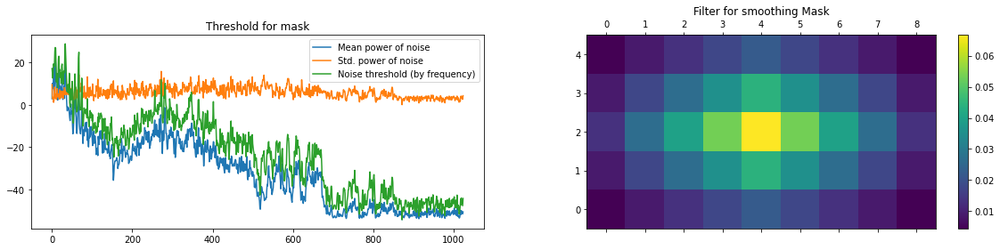

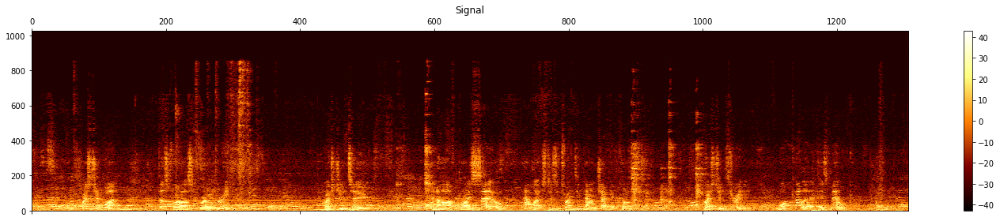

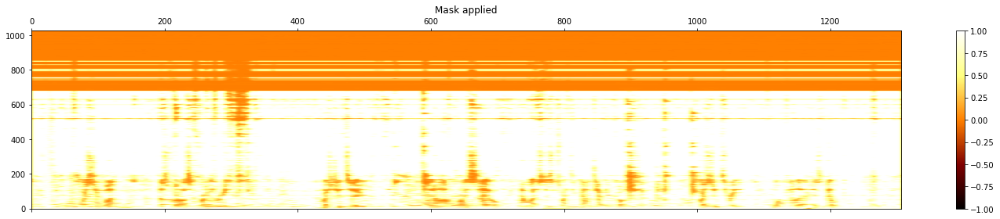

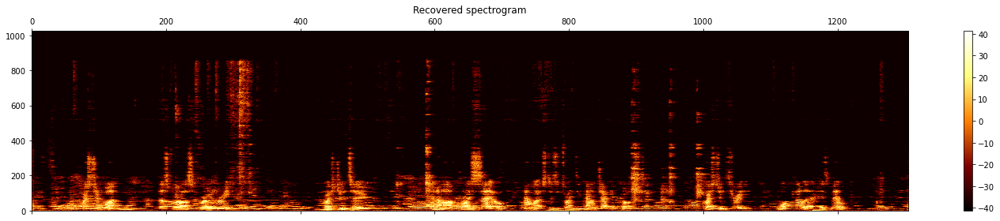

In [39]:
# perform noise reduction
reduced_noise = nr.reduce_noise(audio_clip=data, noise_clip=noisy_part, verbose=True)

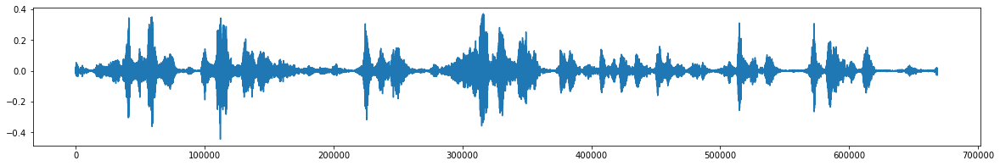

In [40]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

Processed audio:

In [41]:
IPython.display.Audio(data=reduced_noise, rate=rate)

Although the speaker's voice is clearer, we can still hear some noisy signal in the background.\
This shows that spectral subtraction does not work well on removing inscontant background noise. Thus, we will be using RNNoise to solve this problem.
 
Thank you!


### Reference:
https://pypi.org/project/noisereduce/